In [28]:
import pandas as pd
import matplotlib.pyplot as plt
from VAE_model_tablets_class import VAE
import torch
from era_data import TabletPeriodDataset, get_IDS
from collections import Counter
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.cluster import KMeans
import seaborn as sns 
import warnings
from scipy.cluster import hierarchy
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from visualization_funcs import generate_mean_tablet_plot
from tqdm import tqdm 
from itertools import product
import matplotlib.pyplot as plt
import xgboost as xgb

warnings.simplefilter(action='ignore', category=FutureWarning)

# Hyperparameters

In [5]:
IMG_DIR = 'output/images_preprocessed'
BATCH_SIZE = 16
VERSION_NAME = 'period_clf_bs16_lr5e-05_beta_1_epochs_30-VAE-94936_samples-masked_w_classification_loss-equalpartsloss-March29'
IDS = get_IDS(IMG_DIR=IMG_DIR)
print(len(IDS))

94936


In [7]:
num_classes = len(TabletPeriodDataset.PERIOD_INDICES)
class_weights = torch.load("data/class_weights_period.pt")

# Loading Encoding Dataframes

In [68]:
df_encodings_train = pd.read_csv(f"vae_encodings_and_data/vae_encoding_df_March30_w_class_train.csv")
df_encodings_test = pd.read_csv(f"vae_encodings_and_data/vae_encoding_df_March30_w_class_test.csv")

# Load model

In [69]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [70]:
chekpoint_path = f'lightning_logs/{VERSION_NAME}/checkpoints/epoch=29-step=170458.ckpt'

In [71]:
vae_model = VAE.load_from_checkpoint(chekpoint_path,image_channels=1,z_dim=12, lr =5e-5, use_classification_loss=True, num_classes=num_classes,
            loss_type="weighted", class_weights=class_weights, device = device)

/sise/mickyfi-group/kapond/AnalysisBySynthesis/VAE_model_tablets_class.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.class_weights = torch.tensor(class_weights).to(device)


# Classes Distribution

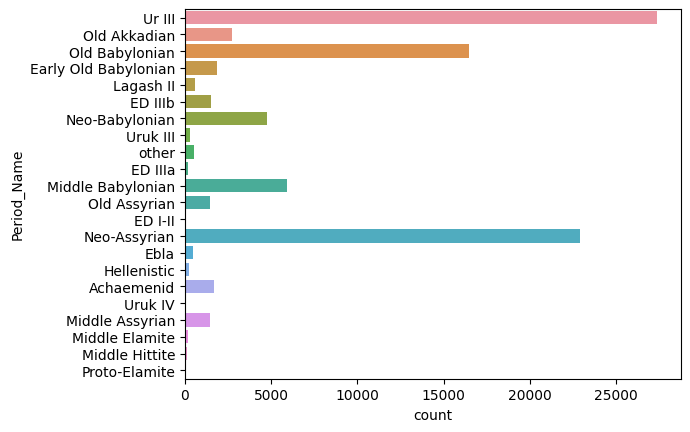

In [72]:
sns.countplot(y = df_encodings_train.Period_Name);

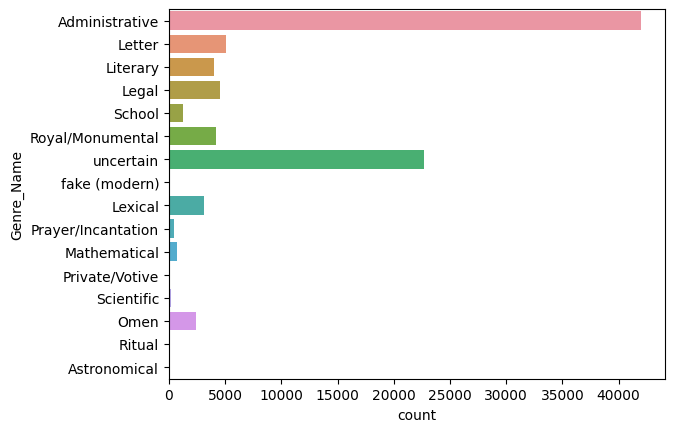

In [73]:
sns.countplot(y = df_encodings_train.Genre_Name);

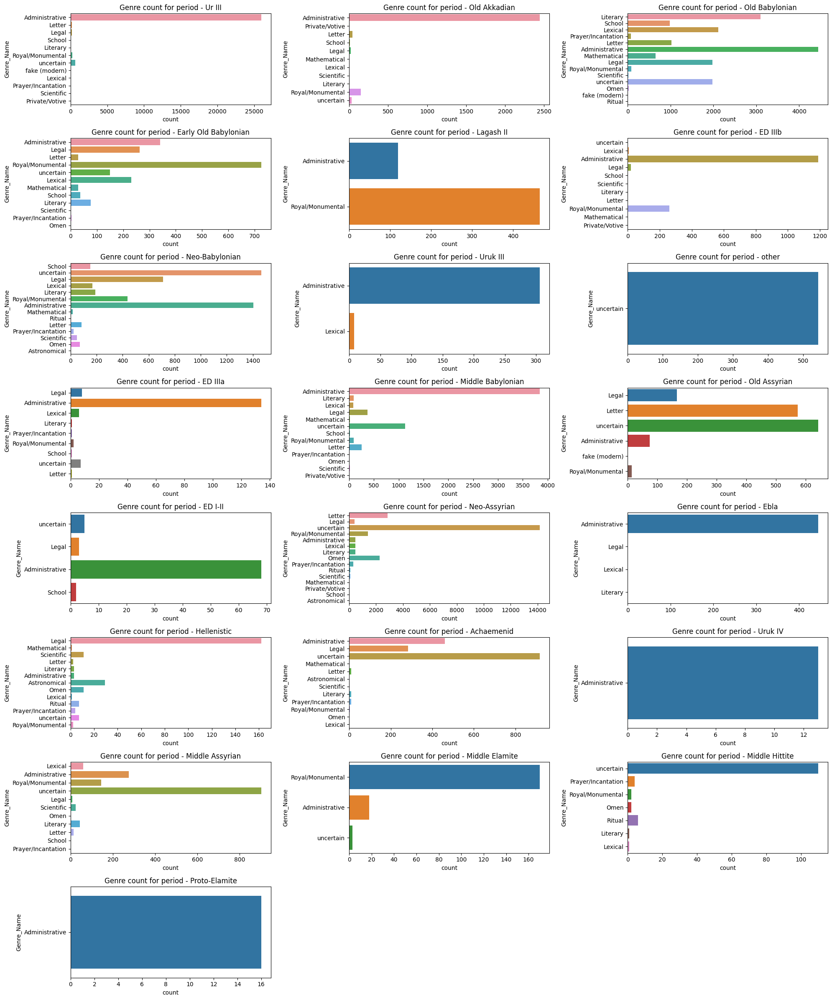

In [74]:
periods = df_encodings_train.Period_Name.unique()

n_rows = len(periods) // 3 + (1 if len(periods) % 3 else 0)

plt.figure(figsize=(20, n_rows * 3)) 

for i, period in enumerate(periods, start=1):
    plt.subplot(n_rows, 3, i)
    sns.countplot(y = df_encodings_train[df_encodings_train.Period_Name == period].Genre_Name)
    plt.title(f'Genre count for period - {period}')

plt.tight_layout()
plt.show()


# Classification based on Periods and genres (separately) 

This will enable us to assess the effectiveness of the VAE encodings as predictors for the genre/period classification tasks, even though the VAE wasn't initially trained for this purpose. It will indicate whether our research approach is on the right track and if tablet shapes correlate with their respective creation periods.

## Train-test division

In [75]:
y_train_period = df_encodings_train['Period']
X_train_period = df_encodings_train.drop(['Period', 'Genre', 'Period_Name','Genre_Name', 'CDLI_id'], axis = 1)

y_train_genre = df_encodings_train['Genre']
X_train_genre = df_encodings_train.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name', 'CDLI_id'], axis = 1)

y_test_period = df_encodings_test['Period']
X_test_period = df_encodings_test.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name', 'CDLI_id'], axis = 1)

y_test_genre = df_encodings_test['Genre']
X_test_genre = df_encodings_test.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name', 'CDLI_id'], axis = 1)

In [76]:
df_encodings_train

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,Period,Genre,CDLI_id,Period_Name,Genre_Name
0,-3.643252,-0.475712,0.565473,1.077328,-1.480226,-1.677127,0.326542,1.113408,-1.068632,1.440241,1.373903,-1.197511,1,1,100002,Ur III,Administrative
1,-3.888688,-0.113735,0.209597,1.359494,-1.568690,-1.114896,0.639526,0.738140,-2.040545,1.707073,1.067712,-2.058996,1,1,100003,Ur III,Administrative
2,-2.506241,1.158152,-0.007125,2.250131,-1.318396,-2.108756,0.117858,1.708672,-0.000316,0.084254,2.402770,-1.524815,1,1,100004,Ur III,Administrative
3,-1.798709,0.421078,-0.008278,1.706591,-0.368345,-1.032822,1.377499,1.598364,-0.574620,1.155535,2.401171,-0.538550,1,1,100005,Ur III,Administrative
4,-0.889585,-0.656950,-1.426044,3.186678,-0.575644,1.495694,0.959123,0.282445,-1.262390,0.147137,2.025245,1.280166,1,1,100012,Ur III,Administrative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90906,-3.631665,3.261284,-0.472314,0.549005,1.129789,0.147559,-0.147601,2.770076,-0.439729,-1.491808,-2.591388,1.842873,1,1,514392,Ur III,Administrative
90907,-2.290280,2.199746,-1.264731,1.873721,2.502774,-1.357388,0.645650,1.949980,-0.606015,-0.876199,-0.794809,1.809879,1,1,517184,Ur III,Administrative
90908,-4.582414,-0.043234,-0.784444,-0.330886,0.006458,1.329736,-5.343539,5.755709,2.404442,-1.285794,-2.623605,-5.254508,1,4,518362,Ur III,Royal/Monumental
90909,1.280831,2.130826,-1.886318,0.851008,0.917226,0.576498,3.974513,0.413289,-2.074630,-1.110686,0.167675,0.093965,3,9,519322,Old Babylonian,School


# KMeans

In [77]:
scaler = StandardScaler()
scaled_data_train = scaler.fit_transform(X_train_period)

In [78]:
wcss = []

for k in range(1, 22):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(scaled_data_train)
    wcss.append(kmeans.inertia_) 

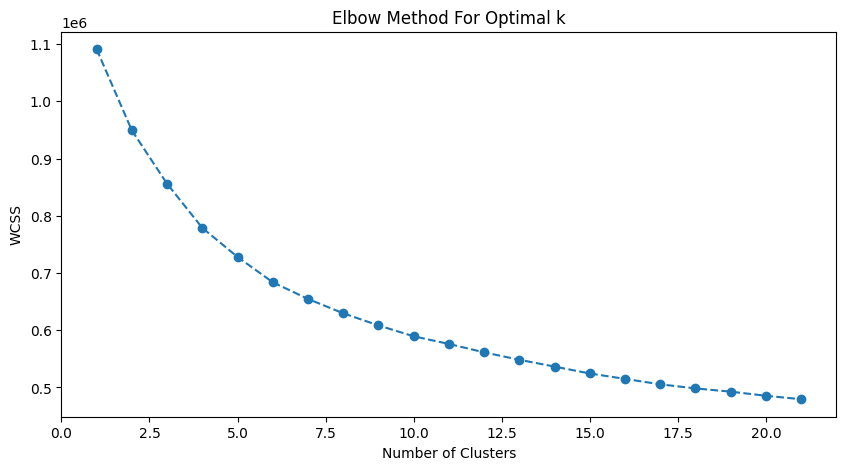

In [79]:
plt.figure(figsize=(10,5))
plt.plot(range(1, 22), wcss, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [80]:
kmeans_period = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y_period_kmeans = kmeans_period.fit_predict(scaled_data_train)

kmeans_df = df_encodings_train[['Genre_Name', 'Period_Name']].copy()
kmeans_df['kmeans_cluster'] = pred_y_period_kmeans
grouped_kmeans = kmeans_df.groupby(['kmeans_cluster', 'Period_Name']).size().reset_index(name='count')

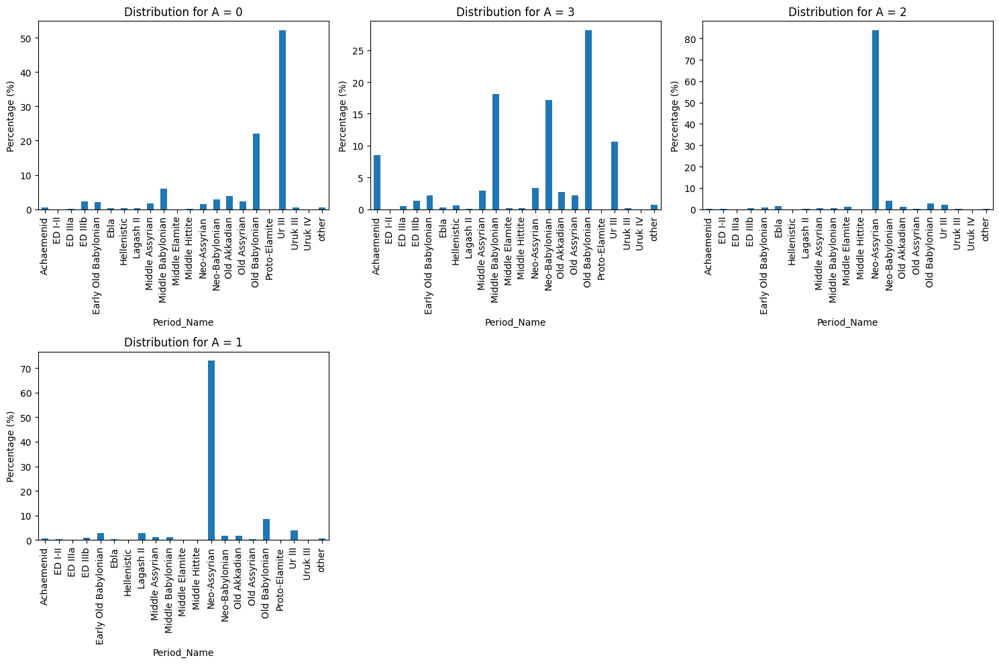

In [81]:
unique_values_A = kmeans_df['kmeans_cluster'].unique()

n_rows = int(np.ceil(len(unique_values_A) / 3.0))
fig, axes = plt.subplots(n_rows, 3, figsize=(15, 5 * n_rows))

if axes.ndim == 1:
    axes = axes.reshape(-1, 3)

for idx, value in enumerate(unique_values_A):
    row, col = divmod(idx, 3)
    ax = axes[row, col]
    subset = grouped_kmeans[grouped_kmeans['kmeans_cluster'] == value].copy()
    total = subset['count'].sum()
    subset['percentage'] = (subset['count'] / total) * 100
    subset.plot(x='Period_Name', y='percentage', kind='bar', ax=ax, legend=False)
    ax.set_title(f'Distribution for A = {value}')
    ax.set_ylabel('Percentage (%)')

for idx in range(len(unique_values_A), n_rows * 3):
    row, col = divmod(idx, 3)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [82]:
grouped_kmeans_genre = kmeans_df.groupby(['kmeans_cluster', 'Genre_Name']).size().reset_index(name='count')

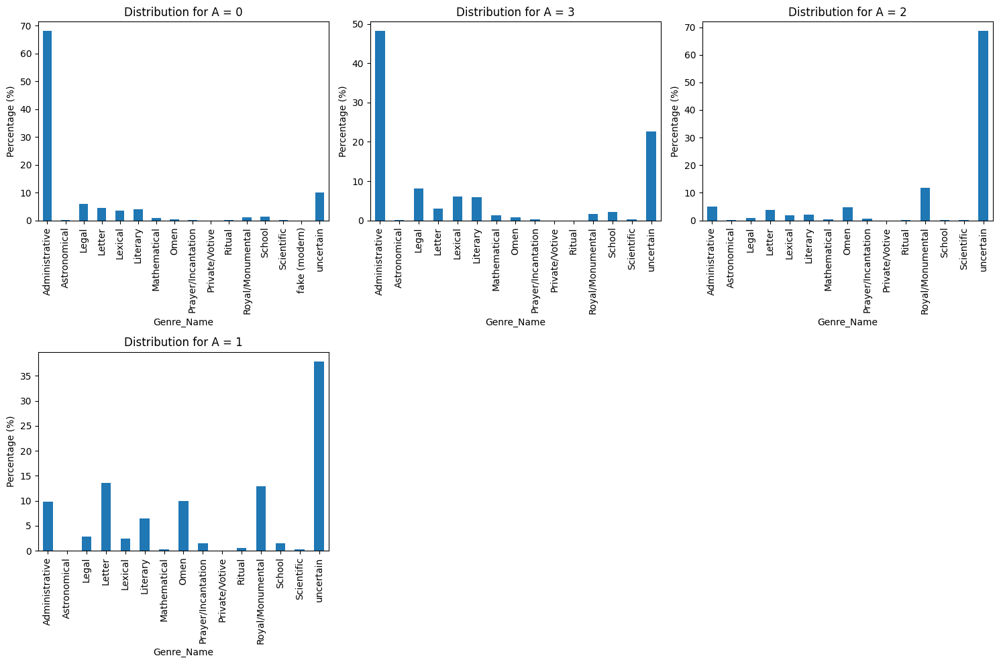

In [83]:
unique_values_A = kmeans_df['kmeans_cluster'].unique()

n_rows = int(np.ceil(len(unique_values_A) / 3.0))
fig, axes = plt.subplots(n_rows, 3, figsize=(15, 5 * n_rows))

if axes.ndim == 1:
    axes = axes.reshape(-1, 3)

for idx, value in enumerate(unique_values_A):
    row, col = divmod(idx, 3)
    ax = axes[row, col]
    subset = grouped_kmeans_genre[grouped_kmeans_genre['kmeans_cluster'] == value].copy()
    total = subset['count'].sum()
    subset['percentage'] = (subset['count'] / total) * 100
    subset.plot(x='Genre_Name', y='percentage', kind='bar', ax=ax, legend=False)
    ax.set_title(f'Distribution for A = {value}')
    ax.set_ylabel('Percentage (%)')

# Hide any unused subplots
for idx in range(len(unique_values_A), n_rows * 3):
    row, col = divmod(idx, 3)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

We can see that nothing is quite distinguishable besides: Neo Assyrian, Ur III and Old Babylonian, and also Administrative and uncertain genres, basically the largest classes of each type.

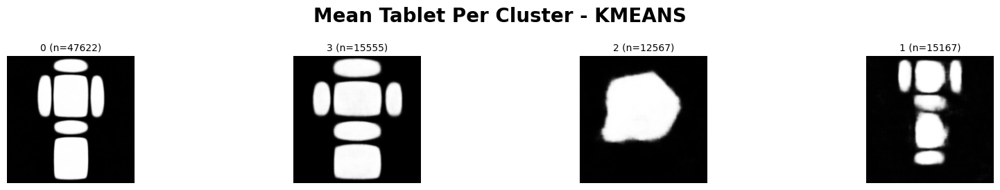

In [84]:
kmeans_analysis_df = X_train_period.copy()
kmeans_analysis_df['kmeans_cluster'] = kmeans_df['kmeans_cluster']
mean_enc_df = generate_mean_tablet_plot(kmeans_analysis_df, column_name='kmeans_cluster', model=vae_model, grid_title="Mean Tablet Per Cluster - KMEANS")

# Period classifier
### Training a model based on the encoding

In [85]:
num_classes_period = len(TabletPeriodDataset.PERIOD_INDICES) + 2

In [87]:
D_train_period = xgb.DMatrix(X_train_period, label=y_train_period)
D_test_period = xgb.DMatrix(X_test_period, label=y_test_period)

In [88]:
cv_results = []
nfold = 5
early_stopping_rounds = 10
param_grid = {
    'eta': [0.1, 0.5, 0.7],
    'max_depth': [6, 10, 15],
    'subsample': [0.5, 0.7, 1.0],
    'colsample_bytree': [0.5, 0.7, 1.0],
}

param_combinations = list(product(param_grid['eta'], param_grid['max_depth'], 
                                  param_grid['subsample'], param_grid['colsample_bytree']))

for eta, max_depth, subsample, colsample_bytree in tqdm(param_combinations, desc="Tuning"):
    param = {
        'eta': eta,
        'max_depth': max_depth,
        'subsample': subsample,
        'colsample_bytree': colsample_bytree,
        'objective': 'multi:softprob',
        'num_class': num_classes_period,
        'nthread': 4
    }
    
    cv_result = xgb.cv(param, D_train_period, num_boost_round=50, nfold=nfold,
                       metrics={'mlogloss'}, early_stopping_rounds=early_stopping_rounds, as_pandas=True)
    
    cv_results.append({
        'params': param,
        'mean_mlogloss': cv_result['test-mlogloss-mean'].min(),
        'boost_rounds': cv_result['test-mlogloss-mean'].idxmin()
    })

best_cv_result = min(cv_results, key=lambda x: x['mean_mlogloss'])
print("Best Parameters:", best_cv_result['params'])
print("Best Mean MLogLoss:", best_cv_result['mean_mlogloss'])
print("Boost Rounds:", best_cv_result['boost_rounds'])

Tuning: 100%|██████████| 81/81 [44:19<00:00, 32.83s/it]  

Best Parameters: {'eta': 0.1, 'max_depth': 10, 'subsample': 0.7, 'colsample_bytree': 1.0, 'objective': 'multi:softprob', 'num_class': 24, 'nthread': 4}
Best Mean MLogLoss: 1.071467644213505
Boost Rounds: 49


### Prediction 

In [90]:
best_parameters = {'eta': 0.1, 'max_depth': 10, 'subsample': 0.7, 'colsample_bytree': 1.0, 'objective': 'multi:softprob', 'num_class': 24, 'nthread': 4} # just so i remember
num_boost_round = 49
final_model = xgb.train(best_parameters, D_train_period, num_boost_round=num_boost_round)
best_preds_period = [int(p.argmax()) for p in final_model.predict(D_test_period)]

#### Adding Eras to the prediction labels

In [91]:
def explain(period):
    return f'{period} ({ERA_MAP.get(period, "?")})'

In [92]:
EARLY_BRONZE = {
    'Old Akkadian', 'Ur III',
    'ED IIIb', 'Uruk III',
    'Proto-Elamite', 'Lagash II',
    'Ebla', 'ED IIIa', 'ED I-II',
    'Uruk IV', 'Linear Elamite',
    'Harappan'
    
}
MID_LATE_BRONZE = {
    'Early Old Babylonian',
    'Old Babylonian', 'Old Assyrian',
    'Middle Babylonian', 'Middle Assyrian',
    'Middle Elamite', 'Middle Hittite'
}
IRON = {
    'Neo-Babylonian', 'Neo-Assyrian',
    'Achaemenid', 'Hellenistic',
    'Neo-Elamite'
}
ERA_MAP = {
    **{K: 'EB' for K in EARLY_BRONZE},
    **{K: 'MLB' for K in MID_LATE_BRONZE},
    **{K: 'I' for K in IRON},
}

In [93]:
idx2period = {v: k for k, v in TabletPeriodDataset.PERIOD_INDICES.items()}
idx2period[0] = 'other'

In [94]:
indices_period = list(set(y_test_period) | set(best_preds_period))
PERIOD_LABELS = [explain(idx2period[i]) for i in indices_period]

In [95]:
print(classification_report(y_test_period, best_preds_period, zero_division=0, target_names=PERIOD_LABELS))

                            precision    recall  f1-score   support

                 other (?)       0.00      0.00      0.00         3
               Ur III (EB)       0.73      0.84      0.78       309
          Neo-Assyrian (I)       0.89      0.96      0.92       250
      Old Babylonian (MLB)       0.49      0.60      0.54       179
   Middle Babylonian (MLB)       0.36      0.23      0.28        56
        Neo-Babylonian (I)       0.57      0.47      0.52        49
         Old Akkadian (EB)       0.40      0.18      0.25        22
            Achaemenid (I)       0.56      0.26      0.36        19
Early Old Babylonian (MLB)       0.43      0.10      0.17        29
              ED IIIb (EB)       0.54      0.58      0.56        12
     Middle Assyrian (MLB)       0.50      0.07      0.12        15
        Old Assyrian (MLB)       1.00      0.41      0.58        22
             Uruk III (EB)       0.00      0.00      0.00         1
            Lagash II (EB)       0.50      0.67

#### Repeating the analysis using classes with support >=10, everything else goes to 0: other

In [96]:
COMMON_LABELS_PERIOD = list({k for k, v in Counter(y_test_period).items() if v >= 10})
print(f'Common period labels: ({len(COMMON_LABELS_PERIOD)})')

Common period labels: (11)


In [97]:
y_true_period_c = y_test_period.copy()
y_true_period_c[~np.isin(y_test_period, COMMON_LABELS_PERIOD)] = 0
print(round((~np.isin(y_test_period, COMMON_LABELS_PERIOD)).mean(), 2), 'changed to "other"')

0.02 changed to "other"


In [98]:
preds_period_c = np.array(best_preds_period.copy())
preds_period_c[~np.isin(best_preds_period, COMMON_LABELS_PERIOD)] = 0
print(round((~np.isin(best_preds_period, COMMON_LABELS_PERIOD)).mean(), 2), 'changed to "other"')

0.01 changed to "other"


In [99]:
indices_period_c = list(set(y_true_period_c) | set(preds_period_c))
PERIOD_LABELS_C = [explain(idx2period[i]) for i in indices_period_c]

In [100]:
print(classification_report(y_true_period_c, preds_period_c, target_names=PERIOD_LABELS_C))

                            precision    recall  f1-score   support

                 other (?)       0.57      0.38      0.46        21
               Ur III (EB)       0.73      0.84      0.78       309
          Neo-Assyrian (I)       0.89      0.96      0.92       250
      Old Babylonian (MLB)       0.49      0.60      0.54       179
   Middle Babylonian (MLB)       0.36      0.23      0.28        56
        Neo-Babylonian (I)       0.57      0.47      0.52        49
         Old Akkadian (EB)       0.40      0.18      0.25        22
            Achaemenid (I)       0.56      0.26      0.36        19
Early Old Babylonian (MLB)       0.43      0.10      0.17        29
              ED IIIb (EB)       0.54      0.58      0.56        12
     Middle Assyrian (MLB)       0.50      0.07      0.12        15
        Old Assyrian (MLB)       1.00      0.41      0.58        22

                  accuracy                           0.69       983
                 macro avg       0.59      0.4

In [101]:
cm_period = confusion_matrix(y_true_period_c, preds_period_c)
cm_period_rownorm = (cm_period / cm_period.sum(axis=1)[:, None])

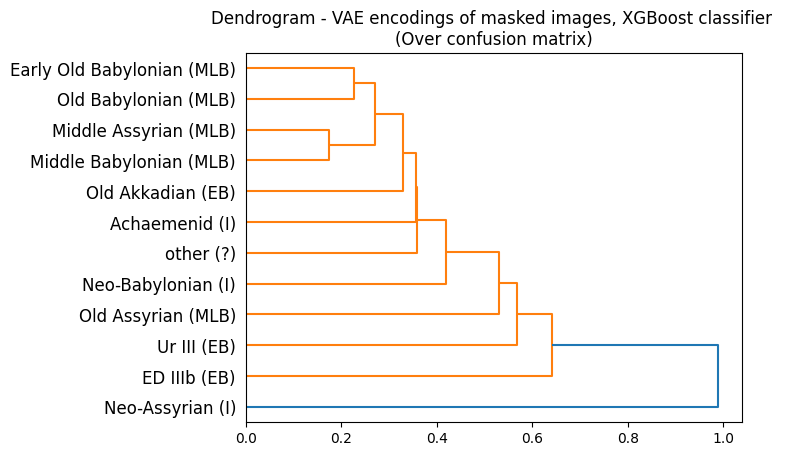

In [102]:
Y = hierarchy.distance.pdist(cm_period_rownorm, metric='euclidean')
Z = hierarchy.linkage(Y, method='single')
ax = hierarchy.dendrogram(Z, show_contracted=True, labels=PERIOD_LABELS_C, orientation='right')
plt.title("Dendrogram - VAE encodings of masked images, XGBoost classifier \n(Over confusion matrix)");

In [103]:
cm = confusion_matrix(y_true_period_c, preds_period_c)

In [104]:
cm_rownorm = (cm / cm.sum(axis=1)[:, None])

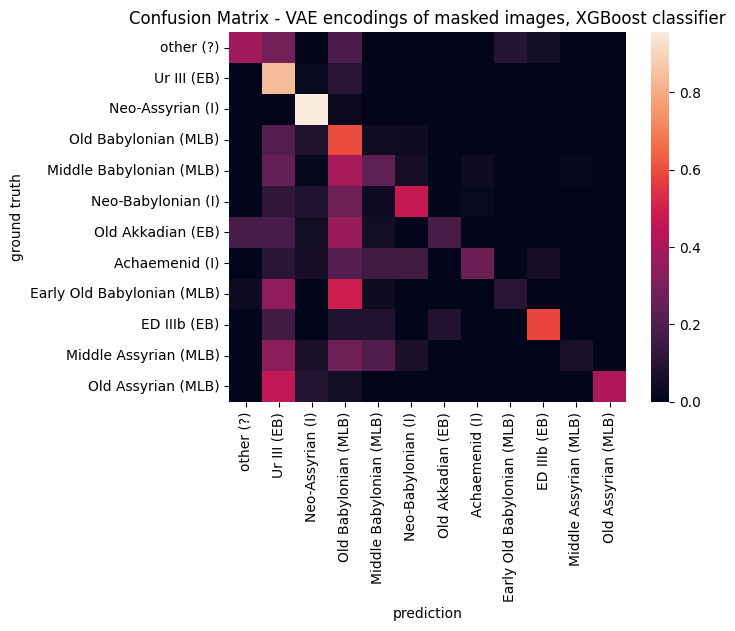

In [105]:
sns.heatmap(cm_rownorm, xticklabels=PERIOD_LABELS_C, yticklabels=PERIOD_LABELS_C);
plt.xlabel('prediction');
plt.ylabel('ground truth')
plt.title("Confusion Matrix - VAE encodings of masked images, XGBoost classifier");

## Genre classifier
### Training a model based on the encoding

In [106]:
import xgboost as xgb

num_classes_genre = len(set(TabletPeriodDataset.GENRE_INDICES.values()))+2

D_train_genre = xgb.DMatrix(X_train_genre, label=y_train_genre)
D_test_genre = xgb.DMatrix(X_test_genre, label=y_test_genre)

# Define XGBoost parameters
param = {
    'eta': 0.5, 
    'max_depth': 10,  
    'objective': 'multi:softprob',  
    'num_class': num_classes_genre 
} 
steps = 50  # The number of training iterations

# Train the model
model_genre = xgb.train(param, D_train_genre, steps)

### Prediction

In [107]:
# Predict Output
best_preds_genre = [int(p.argmax()) for p in model_genre.predict(D_test_genre)]

In [108]:
GENRE_INDICES = {
        
        1: 'Administrative',
        2: 'Letter',
        3: 'Legal',
        4: 'Royal/Monumental',
        5: 'Literary',
        6: 'Lexical',
        7: 'Omen',
        8: 'uncertain',
        9: 'School',
        10: 'Mathematical',
        11: 'Prayer/Incantation',
        12: 'Scientific',
        13: 'Ritual',
        14: 'fake (modern)',
        15: 'Astronomical',
        16: 'Private/Votive',
    }

In [109]:
indices_genre = list(set(y_test_genre) | set(best_preds_genre))
GENRE_LABELS = [GENRE_INDICES[i] for i in indices_genre]

In [110]:
print(classification_report(y_test_genre, best_preds_genre, target_names=GENRE_LABELS, zero_division=False))

                    precision    recall  f1-score   support

    Administrative       0.70      0.92      0.79       456
            Letter       0.55      0.24      0.33        50
             Legal       0.43      0.10      0.16        63
  Royal/Monumental       0.66      0.58      0.61        33
          Literary       0.23      0.07      0.11        41
           Lexical       0.20      0.06      0.09        36
              Omen       0.38      0.31      0.34        26
         uncertain       0.62      0.67      0.64       248
            School       1.00      0.25      0.40        12
      Mathematical       0.00      0.00      0.00         8
Prayer/Incantation       0.00      0.00      0.00         6
        Scientific       0.00      0.00      0.00         2
            Ritual       0.00      0.00      0.00         1
     fake (modern)       0.00      0.00      0.00         1

          accuracy                           0.65       983
         macro avg       0.34      0.2

### Repeating the analysis using classes with support >=10, everything else goes to 8: uncertain

In [111]:
COMMON_LABELS_GENRE = list({k for k, v in Counter(y_test_genre).items() if v >= 10})
print(f'Common period labels: ({len(COMMON_LABELS_GENRE)})')

Common period labels: (9)


In [112]:
y_pred_genre_c = np.array(best_preds_genre.copy())
y_pred_genre_c[~np.isin(best_preds_genre, COMMON_LABELS_GENRE)] = 8
print(round((~np.isin(best_preds_genre, COMMON_LABELS_GENRE)).mean(), 3), 'changed to "uncertain"')

0.001 changed to "uncertain"


In [113]:
y_true_genre_c = y_test_genre.copy()
y_true_genre_c[~np.isin(y_test_genre, COMMON_LABELS_GENRE)] = 8
print(round((~np.isin(y_test_genre, COMMON_LABELS_GENRE)).mean(), 3), 'changed to "uncertain"')

0.018 changed to "uncertain"


In [114]:
indices_genre_c = list(set(y_true_genre_c) | set(y_pred_genre_c))
GENRE_LABELS_C = [GENRE_INDICES[i] for i in indices_genre_c]

In [115]:
print(classification_report(y_true_genre_c.values, y_pred_genre_c, target_names=GENRE_LABELS_C))

                  precision    recall  f1-score   support

  Administrative       0.70      0.92      0.79       456
          Letter       0.55      0.24      0.33        50
           Legal       0.43      0.10      0.16        63
Royal/Monumental       0.66      0.58      0.61        33
        Literary       0.23      0.07      0.11        41
         Lexical       0.20      0.06      0.09        36
            Omen       0.38      0.31      0.34        26
       uncertain       0.63      0.65      0.64       266
          School       1.00      0.25      0.40        12

        accuracy                           0.65       983
       macro avg       0.53      0.35      0.39       983
    weighted avg       0.61      0.65      0.61       983



# Analysis - Per class mean

This analysis allows us to examine the average representation of tablets within each class (period/genre) and delve into the distinctions within each genre/period. This will shed light on whether the VAE model successfully identified shapes in a manner that differentiates between the various classes, without it being trained on a supervised task.

## Mean tablet representation, per genre:

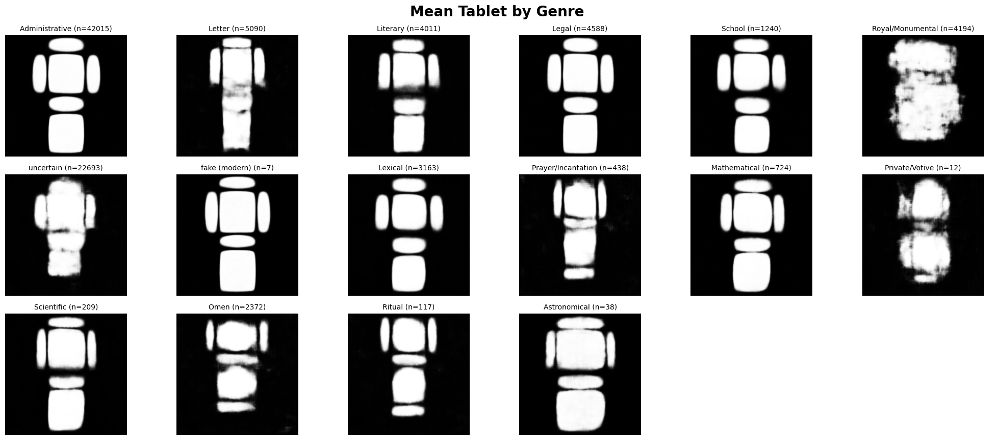

In [117]:
mean_tablet_genre = generate_mean_tablet_plot(df_encodings_train.drop(['Period', 'Genre', 'Period_Name', 'CDLI_id'], axis=1), 
                                              column_name='Genre_Name', model=vae_model, grid_title="Mean Tablet by Genre")

## Mean tablet representation, per period:

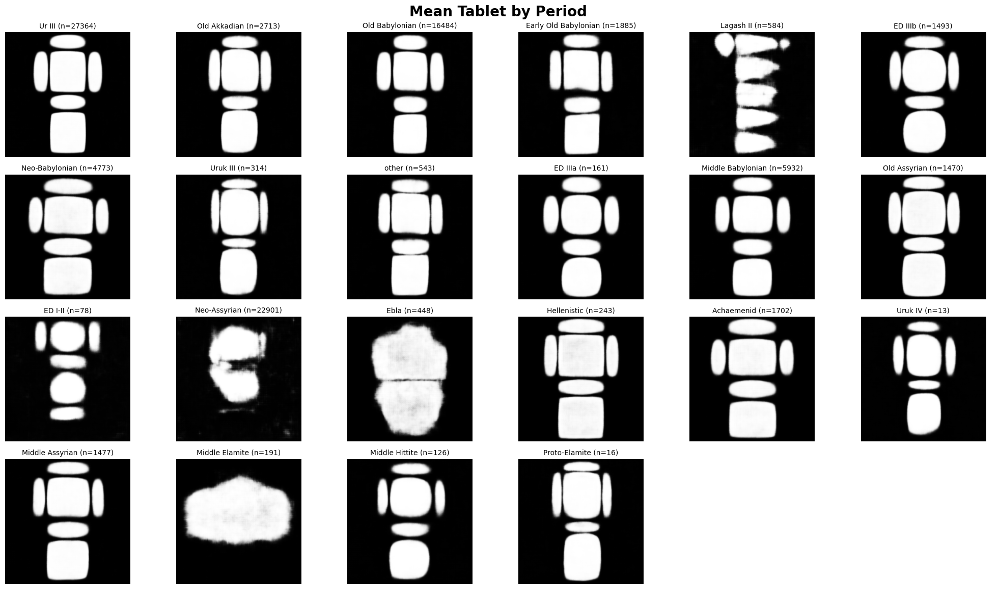

In [118]:
mean_tablet_period = generate_mean_tablet_plot(df_encodings_train.drop(['Period', 'Genre', 'Genre_Name', 'CDLI_id'], axis=1), 
                                              column_name='Period_Name', model=vae_model, grid_title="Mean Tablet by Period")

## Mean tablet representation, per period, per genre:

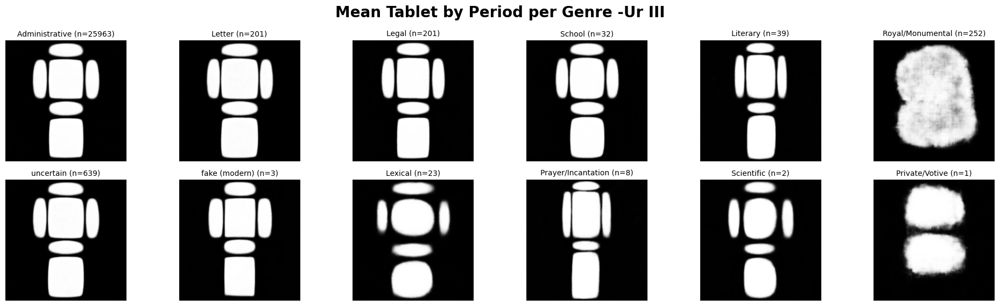

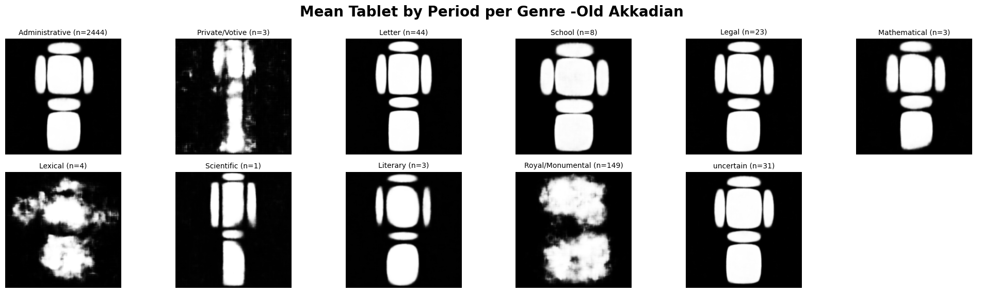

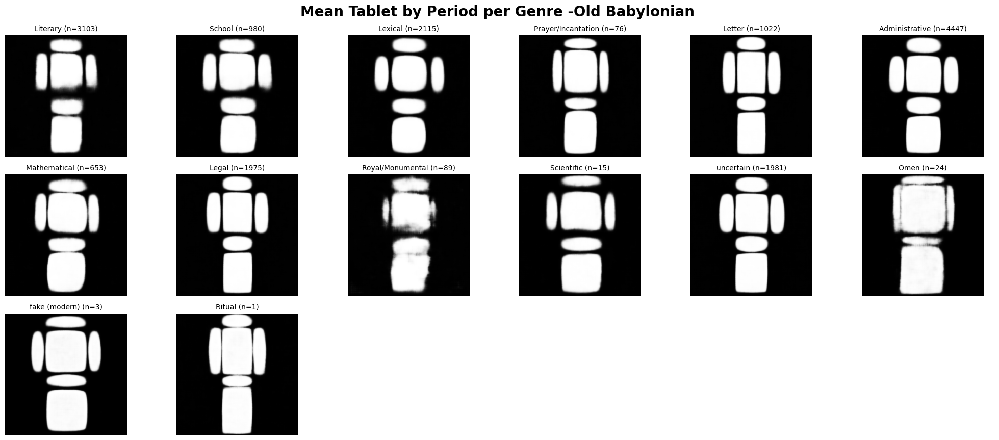

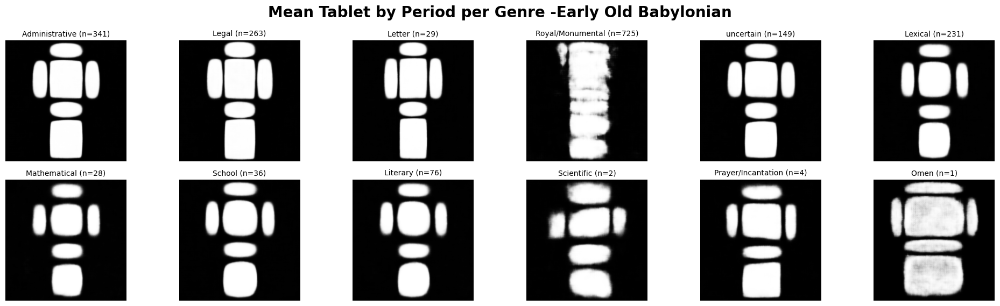

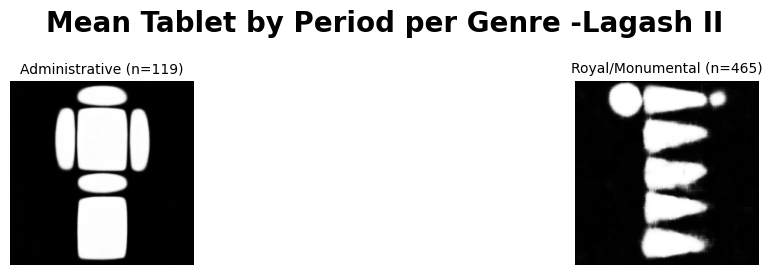

...

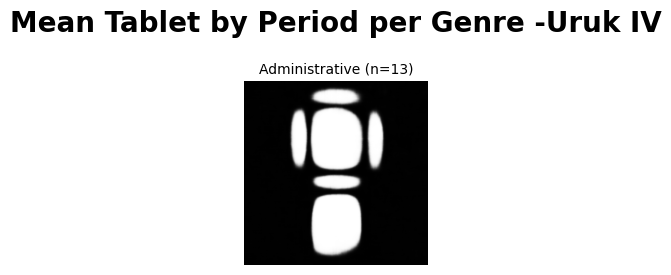

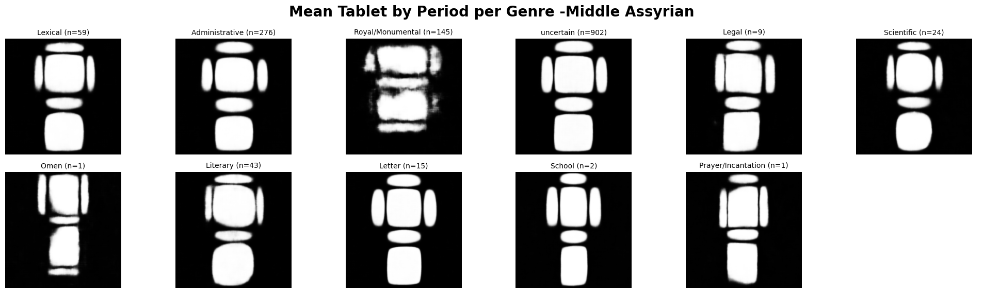

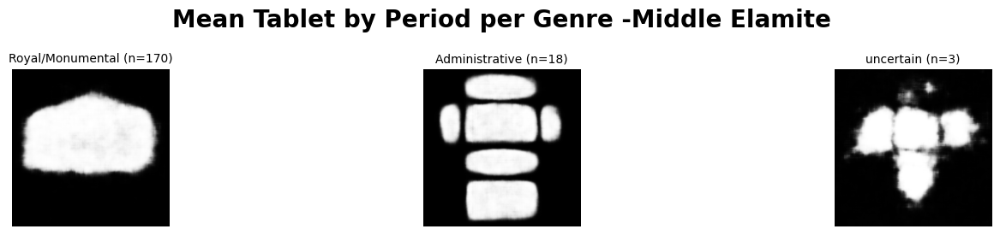

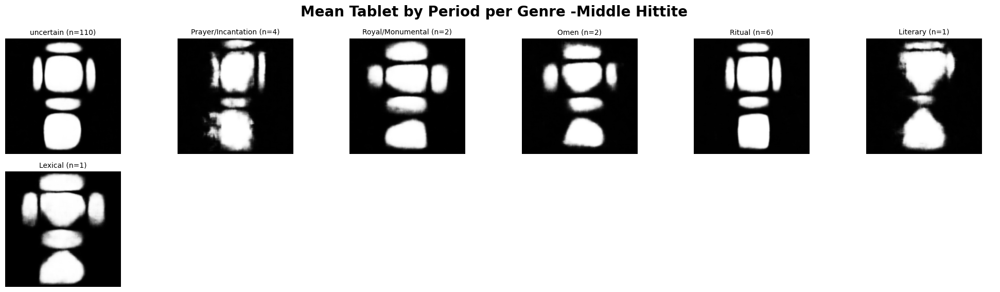

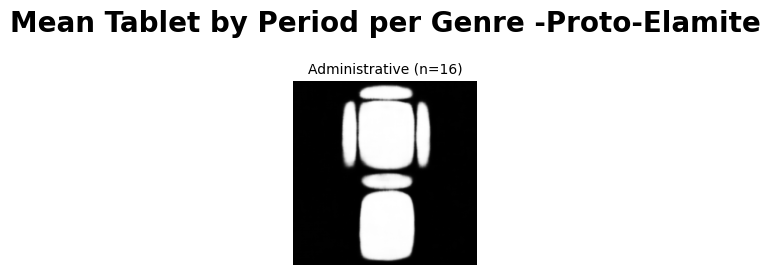

In [120]:
for period in df_encodings_train['Period_Name'].unique():
    generate_mean_tablet_plot(df_encodings_train[df_encodings_train['Period_Name']==period].drop(['Period', 'Genre', 'Period_Name', 'CDLI_id'], axis=1), 
                                              column_name='Genre_Name', model=vae_model, grid_title="Mean Tablet by Period per Genre -"+period)    

# LDA analysis of the encodings

By this analysis, we can see how the encodings cluster, and try to explain the meaning of the cluster division. We could also see how predictive these clusters are of the classes (periods / genres)

### Period LDA

In [121]:
lda_period = LinearDiscriminantAnalysis()
components_period = lda_period.fit_transform(X_train_period, y_train_period)

In [122]:
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets
from ipywidgets import VBox, Output
from IPython.display import display

# Assuming components_period and df_encodings_train are defined as per your initial code snippet

# Define the output widget for the plot
plot_output = Output()

# Define the plotting function
def plot_with_labels(selected_labels):
    with plot_output:
        plot_output.clear_output(wait=True)  # Clear the previous plot
        # Filter data based on selected labels
        filtered_df = df_encodings_train[df_encodings_train['Period_Name'].isin(selected_labels)]
        plt.figure(figsize=(10, 10))
        sns.scatterplot(
            x=components_period[filtered_df.index, 0],
            y=components_period[filtered_df.index, 1],
            hue=filtered_df['Period_Name'],
            palette='colorblind'
        )
        plt.xlabel('LDA Dimension 1')
        plt.ylabel('LDA Dimension 2')
        plt.title('Embedded Space per period - LDA')
        plt.legend()
        plt.show()

# Create a widget for label selection
label_options = df_encodings_train['Period_Name'].unique()
label_selector = widgets.SelectMultiple(
    options=label_options,
    value=[label_options[0]],  # Default value
    description='Labels',
    disabled=False
)

# Function to update the plot based on selection
def on_selection_change(change):
    plot_with_labels(list(label_selector.value))

# Attach the update function to the selection widget for value changes
label_selector.observe(on_selection_change, names='value')

# Display the widget and the initial plot in its output area
display(label_selector, plot_output)
# Initially display the plot
plot_with_labels(list(label_selector.value))


SelectMultiple(description='Labels', index=(0,), options=('Ur III', 'Old Akkadian', 'Old Babylonian', 'Early O…

Output()

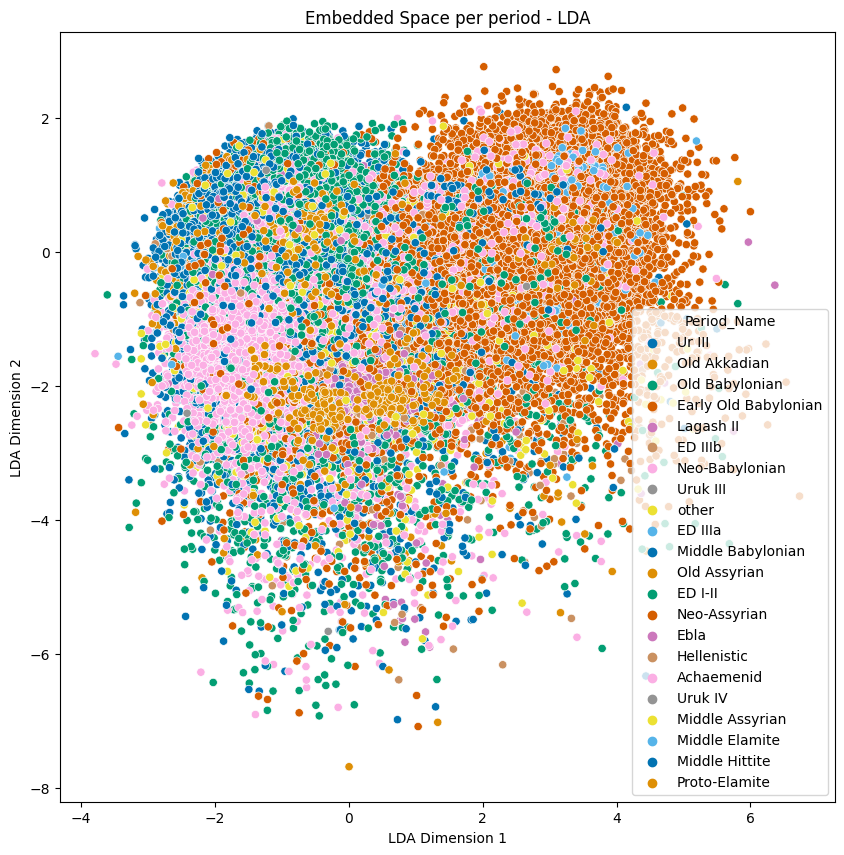

In [123]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=components_period[:, 0], y=components_period[:, 1], hue=df_encodings_train['Period_Name'], palette='colorblind')
plt.xlabel('LDA Dimension 1')
plt.ylabel('LDA Dimension 2')
plt.title('Embedded Space per period - LDA')
plt.show()

In [124]:
lda_preds_period = lda_period.predict(X_test_period)
lda_X_test_period = X_test_period.copy()
lda_X_test_period['lda_preds'] = lda_preds_period

### Let's look at the main shapes in each cluster:

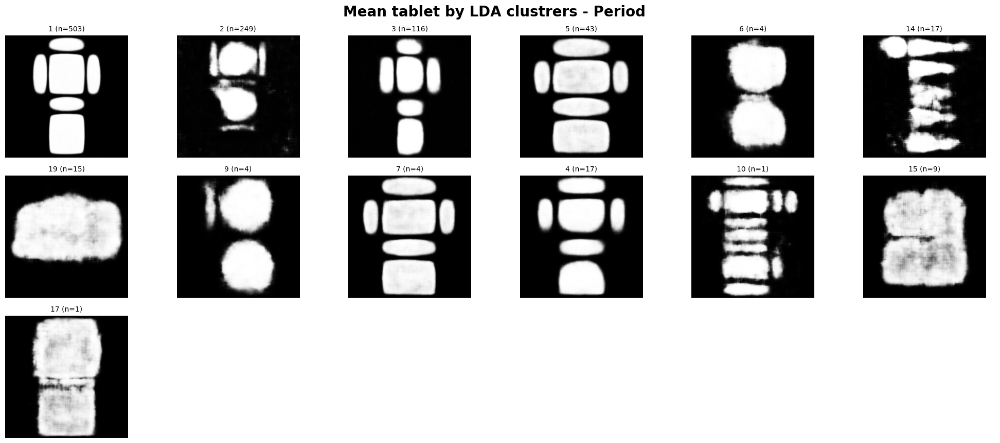

In [125]:
period_lda_clusters_mean = generate_mean_tablet_plot(lda_X_test_period, column_name='lda_preds', model=vae_model, grid_title='Mean tablet by LDA clustrers - Period')

### Genre LDA

In [126]:
lda_genre = LinearDiscriminantAnalysis()
components_genre = lda_genre.fit_transform(X_train_genre, y_train_genre)

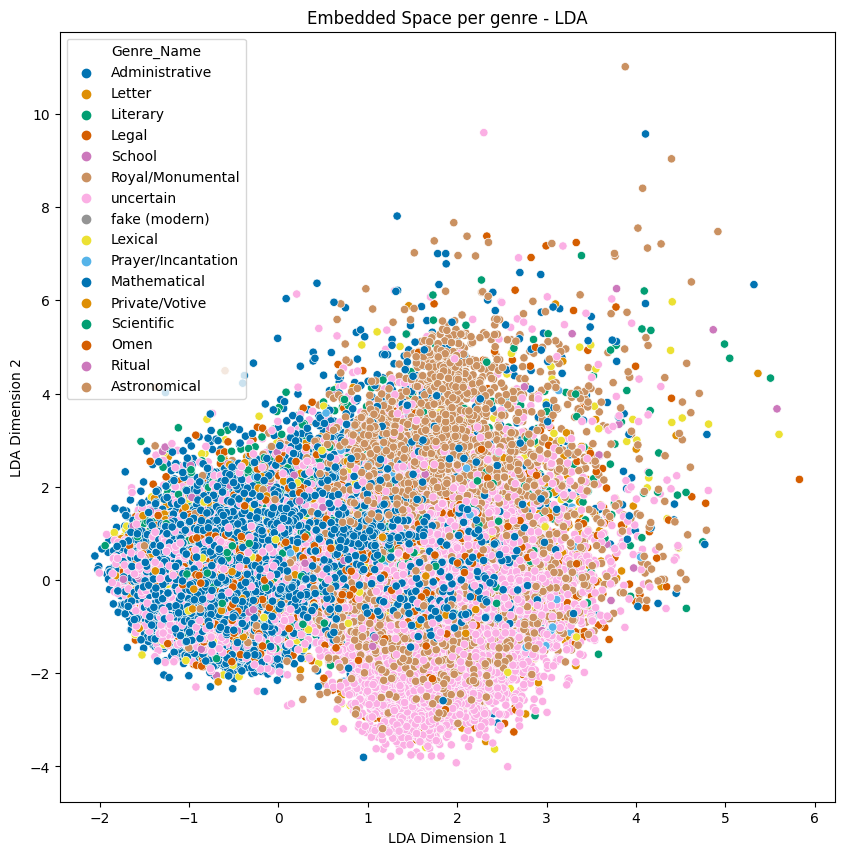

In [127]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=components_genre[:, 0], y=components_genre[:, 1], hue=df_encodings_train['Genre_Name'], palette='colorblind')
plt.xlabel('LDA Dimension 1')
plt.ylabel('LDA Dimension 2')
plt.title('Embedded Space per genre - LDA')
plt.show()

In [128]:
lda_preds_genre = lda_genre.predict(X_train_genre)
lda_X_train_genre = X_train_genre.copy()
lda_X_train_genre['lda_preds_genre'] = lda_preds_genre

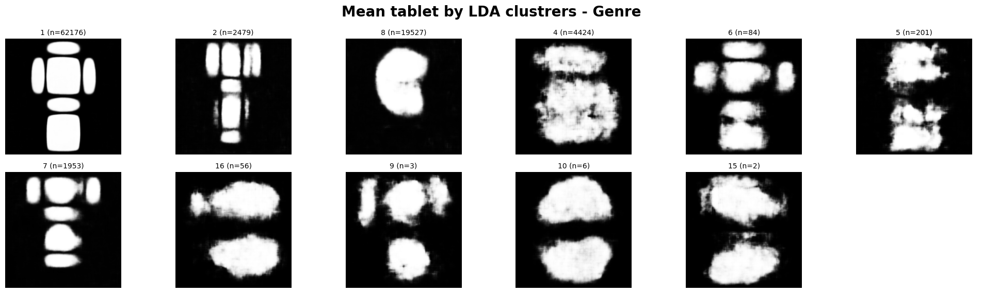

In [129]:
genre_lda_clusters_mean = generate_mean_tablet_plot(lda_X_train_genre, column_name='lda_preds_genre', model=vae_model, grid_title='Mean tablet by LDA clustrers - Genre')